$\textbf{We first get the data from the files _ISP1Requirements.csv and BalancePrices.csv and perform some preprocessing}$

In [101]:
from urllib.parse import urljoin
import datetime as datetime
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib as mpl
import seaborn as sns
import csv
from csv import reader

In [102]:
def make_dt_index(df, timestamp_col, dt_offset=None):
    df.index = pd.to_datetime(
        df.loc[:, timestamp_col], format='%Y-%m-%dT%H:%M:%S.%f'
    )

    if dt_offset:
        df.index = df.index + dt_offset

    df.drop(timestamp_col, axis=1, inplace=True)

    df.sort_index(inplace=True)

    return df


def check_duplicate_index(df, verbose=True):
    """ checks for duplicates in the index of a dataframe """
    dupes = df[df.index.duplicated()]
    num = dupes.shape[0]
    print('{} index duplicates'.format(num))

    if verbose == True:
        print('duplicates are:')
        print(dupes.head(3))

    return df[df.index.duplicated(keep=False)]


def drop_duplicate_index(df):
    return df[~df.index.duplicated(keep='first')]


def check_duplicate_rows(df, verbose=True):
    duplicated_bools = df.duplicated()
    num = np.sum(duplicated_bools)
    print('{} row duplicates'.format(num))

    if verbose:
        df[duplicated_bools].head(3)

    return df[df.duplicated(keep=False)]


def check_nans(df, verbose=True):
    """ checks for NANs in a dataframe """
    nans = df[df.isnull().any(axis=1)]
    num = nans.shape[0]

    print('{} nan rows'.format(num))
    if verbose:
        print('nan values are:')
        print(nans.head())

    return nans


def check_index_length(df, freq, verbose=True):
    """ compare a DatetimeIndex with the expected length """
    ideal = pd.DatetimeIndex(start=df.index[0],
                             end=df.index[-1],
                             freq=freq)

    ideal_len = ideal.shape[0]
    actual_len = df.shape[0]
    num_missing = ideal_len - actual_len
    print('ideal index len {} actual {} missing {}'.format(
        ideal_len, actual_len, num_missing))

    if ideal.shape[0] != df.shape[0]:
        missing = set(df.index).symmetric_difference(set(ideal))

        if verbose:
            print('missing are:')
            print(missing)

        return missing, ideal

    else:
        return None, df.index


def make_df_fill_dt_index(df, freq, method='ffill'):

    missing, ideal = check_index_length(df, freq)

    ideal_idx_df = pd.DataFrame(index=ideal)

    df = pd.concat([ideal_idx_df, df], axis=1)

    return df.fillna(method=method)


def check_dataframe(df, freq, verbose=False):
    """ wraps together all the checks """
    duplicate_index = check_duplicate_index(df, verbose)

    duplicate_rows = check_duplicate_rows(df, verbose)

    nans = check_nans(df, verbose)

    missing_index, ideal_index = check_index_length(df, freq, verbose)

    return {
        'duplicate_index': duplicate_index,
        'duplicate_rows': duplicate_rows,
        'nans': nans,
        'missing_index': missing_index,
        'ideal_index': ideal_index
    }
def plot_distribution( df , var , target , **kwargs ):
    row = kwargs.get( 'row' , None )
    col = kwargs.get( 'col' , None )
    facet = sns.FacetGrid( df , hue=target , aspect=4 , row = row , col = col )
    facet.map( sns.kdeplot , var , shade= True )
    facet.set( xlim=( 0 , df[ var ].max() ) )
    facet.add_legend()

In [103]:
requirements_data = pd.read_csv('_ISP1Requirements.csv')
balancing_prices_data  = pd.read_csv('BalancePrices.csv')

In [104]:
requirements_data['Unnamed: 0'] = pd.to_datetime(requirements_data['Unnamed: 0'])
requirements_data.set_index('Unnamed: 0', drop=True, inplace=True)
requirements_data.index.name = None

In [105]:
balancing_prices_data['Unnamed: 0'] = pd.to_datetime(balancing_prices_data['Unnamed: 0'])
balancing_prices_data.set_index('Unnamed: 0', drop=True, inplace=True)
balancing_prices_data.index.name = None

In [106]:
balancing_prices_data = balancing_prices_data.drop(balancing_prices_data.columns[[9, 10]],axis=1)

In [107]:
requirements_data
requirements_data['Date'] = pd.to_datetime(requirements_data.index)  

In [108]:
balancing_prices_data['Date'] = pd.to_datetime(balancing_prices_data.index)

In [109]:
#greater than the start date and smaller than the end date
start_date = '2021-08-15 00:00:00'
end_date   = '2022-04-17 23:45:00'
mask = (requirements_data['Date'] >= start_date) & (requirements_data['Date'] <= end_date)

In [110]:
requirements_data_new = requirements_data.loc[mask]

In [111]:
requirements_data_hourly =  requirements_data_new.resample('H', on='Date', closed='right').mean().reset_index()

In [112]:
mask_2 = (balancing_prices_data['Date'] >= start_date) & (balancing_prices_data['Date'] <= end_date)

In [113]:
balancing_prices_data_new = balancing_prices_data.loc[mask_2]

In [114]:
balancing_prices_hourly = balancing_prices_data_new.resample('H', on='Date', closed='right').mean().reset_index()

In [115]:
balancing_prices_hourly['Date'] = pd.to_datetime(balancing_prices_hourly['Date'])
balancing_prices_hourly.set_index('Date', drop=True, inplace=True)
balancing_prices_hourly.index.name = None

In [116]:
requirements_data_hourly['Date'] = pd.to_datetime(requirements_data_hourly['Date'])
requirements_data_hourly.set_index('Date', drop=True, inplace=True)
requirements_data_hourly.index.name = None

In [117]:
balancing_prices_hourly =  balancing_prices_hourly.iloc[1: , :]

In [118]:
requirements_data_hourly =requirements_data_hourly.iloc[1: , :]

In [119]:
requirements_data_hourly

,RES,Load,Mandatory Hydro,Total FRR
2021-08-15 00:00:00,1820.000000,5515.500000,50.0,914.000000
2021-08-15 01:00:00,1930.000000,5299.000000,50.0,939.000000
2021-08-15 02:00:00,2000.000000,5127.500000,50.0,949.000000
2021-08-15 03:00:00,2035.000000,5038.000000,63.0,939.000000
2021-08-15 04:00:00,2055.000000,4951.500000,76.0,1079.000000
2021-08-15 05:00:00,2105.000000,4880.500000,117.5,1384.000000
2021-08-15 06:00:00,2435.000000,5053.500000,185.0,1474.000000
2021-08-15 07:00:00,3055.000000,5346.500000,213.0,1499.000000
2021-08-15 08:00:00,3715.000000,5646.500000,200.0,1479.000000
2021-08-15 09:00:00,4145.000000,6011.500000,168.0,1459.000000


In [120]:
balancing_prices_hourly

,Total Activated Balancing Energy UP (MWh),Total Activated Balancing Energy Down (MWh),Total Activated Balancing Energy (MWh),Imbalance Price (€/MWh),mFRR Price UP (€/MWh),mFRR Price Down (€/MWh),Uplift Account 1 (€/MWh),Uplift Account 2 (€/MWh),Uplift Account 3 (€/MWh)
2021-08-15 00:00:00,64.696300,162.704473,-98.008173,38.036567,141.390000,40.762500,2.738548,0.662670,5.481142
2021-08-15 01:00:00,47.823965,117.162650,-69.338685,23.803718,86.927500,26.332500,2.375837,1.098814,2.754350
2021-08-15 02:00:00,37.976322,56.592600,-18.616278,25.178707,27.825000,0.010000,2.143069,1.201918,3.213499
2021-08-15 03:00:00,36.129990,105.814593,-69.684602,0.010000,28.592500,0.010000,2.043232,1.117085,3.079745
2021-08-15 04:00:00,34.597000,90.711290,-56.114290,17.827500,28.592500,17.827500,2.227400,1.156230,2.383576
2021-08-15 05:00:00,23.384867,88.882660,-65.497793,37.320917,21.475000,37.652500,2.415373,1.498065,0.763712
2021-08-15 06:00:00,56.135750,116.949175,-60.813425,32.928623,112.387500,33.087500,2.536944,1.597661,3.928055
2021-08-15 07:00:00,62.005892,131.068113,-69.062220,60.054188,82.555000,61.652500,2.723008,0.980892,2.221637
2021-08-15 08:00:00,32.436923,132.730417,-100.293495,45.508474,89.160000,48.142500,2.246637,1.604952,2.926384
2021-08-15 09:00:00,31.486835,130.387880,-98.901045,13.401893,0.000000,14.975000,1.786450,1.295112,2.843992


$\textbf{Now we are going to add the Load Forecast from the entsoe api and some other exogenous features}$

In [121]:
from entsoe import EntsoePandasClient
import pandas as pd
api_key="7d2255de-e63f-4766-805a-0c0a1f6e7fa3"
client = EntsoePandasClient(api_key=api_key)
country_code = 'GR'

In [122]:
start = pd.Timestamp('20210814', tz='UTC')
end = pd.Timestamp('20220418', tz='UTC')
load_forecast = client.query_load_forecast(country_code, start=start, end = end)
load_forecast.head()

,Forecasted Load
2021-08-14 03:00:00+03:00,5740.0
2021-08-14 04:00:00+03:00,5560.0
2021-08-14 05:00:00+03:00,5489.0
2021-08-14 06:00:00+03:00,5422.0
2021-08-14 07:00:00+03:00,5570.0


In [123]:
load_forecast = load_forecast.iloc[21:5925,:]

In [124]:
load_forecast = load_forecast.set_index(balancing_prices_hourly.index)

In [125]:
combined_dataframes = pd.concat([balancing_prices_hourly, requirements_data_hourly,load_forecast], axis=1, join="inner")

In [126]:
combined_dataframes.head()

,Total Activated Balancing Energy UP (MWh),Total Activated Balancing Energy Down (MWh),Total Activated Balancing Energy (MWh),Imbalance Price (€/MWh),mFRR Price UP (€/MWh),mFRR Price Down (€/MWh),Uplift Account 1 (€/MWh),Uplift Account 2 (€/MWh),Uplift Account 3 (€/MWh),RES,Load,Mandatory Hydro,Total FRR,Forecasted Load
2021-08-15 00:00:00,64.696300,162.704473,-98.008173,38.036567,141.3900,40.7625,2.738548,0.662670,5.481142,1820.0,5515.5,50.0,914.0,6021.0
2021-08-15 01:00:00,47.823965,117.162650,-69.338685,23.803718,86.9275,26.3325,2.375837,1.098814,2.754350,1930.0,5299.0,50.0,939.0,5636.0
2021-08-15 02:00:00,37.976322,56.592600,-18.616278,25.178707,27.8250,0.0100,2.143069,1.201918,3.213499,2000.0,5127.5,50.0,949.0,5355.0
2021-08-15 03:00:00,36.129990,105.814593,-69.684602,0.010000,28.5925,0.0100,2.043232,1.117085,3.079745,2035.0,5038.0,63.0,939.0,5165.0
2021-08-15 04:00:00,34.597000,90.711290,-56.114290,17.827500,28.5925,17.8275,2.227400,1.156230,2.383576,2055.0,4951.5,76.0,1079.0,4994.0


In [127]:
check_nans(combined_dataframes)
features = combined_dataframes.columns

0 nan rows
nan values are:
Empty DataFrame
Columns: [Total Activated Balancing Energy UP (MWh), Total Activated Balancing Energy Down (MWh), Total Activated Balancing Energy (MWh), Imbalance Price  (€/MWh), mFRR Price UP (€/MWh), mFRR Price Down (€/MWh), Uplift Account 1 (€/MWh), Uplift Account 2 (€/MWh), Uplift Account 3 (€/MWh), RES, Load, Mandatory Hydro, Total FRR, Forecasted Load]
Index: []


In [128]:
Imbalance_price = combined_dataframes[features[3]]

combined_dataframes_new = combined_dataframes.drop(features[3],axis=1)

In [129]:
combined_dataframes_new["Imbalance_price"] = Imbalance_price

In [130]:
combined_dataframes_new.head()

,Total Activated Balancing Energy UP (MWh),Total Activated Balancing Energy Down (MWh),Total Activated Balancing Energy (MWh),mFRR Price UP (€/MWh),mFRR Price Down (€/MWh),Uplift Account 1 (€/MWh),Uplift Account 2 (€/MWh),Uplift Account 3 (€/MWh),RES,Load,Mandatory Hydro,Total FRR,Forecasted Load,Imbalance_price
2021-08-15 00:00:00,64.696300,162.704473,-98.008173,141.3900,40.7625,2.738548,0.662670,5.481142,1820.0,5515.5,50.0,914.0,6021.0,38.036567
2021-08-15 01:00:00,47.823965,117.162650,-69.338685,86.9275,26.3325,2.375837,1.098814,2.754350,1930.0,5299.0,50.0,939.0,5636.0,23.803718
2021-08-15 02:00:00,37.976322,56.592600,-18.616278,27.8250,0.0100,2.143069,1.201918,3.213499,2000.0,5127.5,50.0,949.0,5355.0,25.178707
2021-08-15 03:00:00,36.129990,105.814593,-69.684602,28.5925,0.0100,2.043232,1.117085,3.079745,2035.0,5038.0,63.0,939.0,5165.0,0.010000
2021-08-15 04:00:00,34.597000,90.711290,-56.114290,28.5925,17.8275,2.227400,1.156230,2.383576,2055.0,4951.5,76.0,1079.0,4994.0,17.827500


In [131]:
def df_info(df):
    len_df = len(df)
    sample = []
    p_nan = []
    corrSP = []
    all_uniq = []
    feature = features[3]
    for i in df.columns:
        head_col = str(list(df[i].head(5)))
        sample.append(head_col)
        all_nan = df[i].isna().sum() #.sum()
        if all_nan == len_df:
            p_nan.append(100)
        elif all_nan == 0:
            p_nan.append(0)
        else:
            p_nan.append(round(all_nan / len_df * 100, 2))
         
        if df[i].nunique() <= 5:
            all_uniq.append(str(list(set(df[i]))))
        else:
            all_uniq.append("Several")
 
    if "Imbalance_price" in df:
        corrSP = df.corr(method='pearson').Imbalance_price
    else:
        corrSP = np.nan

    list_of_numerics = df.select_dtypes(include = ['float','int']).columns
    outl = df.apply(lambda x: sum(
                     (x<(x.quantile(0.05) - 1.5 * (x.quantile(0.95)-x.quantile(0.05)))) |
                     (x>(x.quantile(0.95) + 1.5 * (x.quantile(0.95)-x.quantile(0.05))))
                     if x.name in list_of_numerics else '') )

    df_resume = pd.DataFrame({ 
                        'type': list(df.dtypes),
                        'Sample': sample,
                        "% of NaN": p_nan,
                        "Corr_with_y": corrSP,
                        'Duplicates' : (df.duplicated()).sum(),
                        'Amount Uniques' : df.nunique(),
                        'Uniques' : all_uniq,                        
                        'Outliers' : outl } , index = df.columns)
    
    return df_resume

pd.set_option('max_rows', None)


In [132]:
###### Statistics for 
df_info(combined_dataframes_new)

,type,Sample,% of NaN,Corr_with_y,Duplicates,Amount Uniques,Uniques,Outliers
Total Activated Balancing Energy UP (MWh),float64,"[64.6963, 47.823965, 37.976322499999995, 36.12...",0,0.592970,0,5904,Several,0
Total Activated Balancing Energy Down (MWh),float64,"[162.7044725, 117.16265, 56.592600000000004, 1...",0,-0.372177,0,5904,Several,0
Total Activated Balancing Energy (MWh),float64,"[-98.00817250000001, -69.33868500000001, -18.6...",0,0.671568,0,5904,Several,0
mFRR Price UP (€/MWh),float64,"[141.39, 86.92750000000001, 27.825, 28.5925, 2...",0,0.768857,0,5034,Several,20
mFRR Price Down (€/MWh),float64,"[40.7625, 26.3325, 0.01, 0.01, 17.8275]",0,0.395989,0,4711,Several,0
Uplift Account 1 (€/MWh),float64,"[2.7385476725, 2.3758374875, 2.143069245000000...",0,0.690137,0,5904,Several,0
Uplift Account 2 (€/MWh),float64,"[0.662670305, 1.0988136525, 1.2019179125, 1.11...",0,0.263268,0,5904,Several,29
Uplift Account 3 (€/MWh),float64,"[5.48114178, 2.7543496524999997, 3.21349915, 3...",0,0.290910,0,5904,Several,20
RES,float64,"[1820.0, 1930.0, 2000.0, 2035.0, 2055.0]",0,-0.081067,0,857,Several,0
Load,float64,"[5515.5, 5299.0, 5127.5, 5038.0, 4951.5]",0,0.220631,0,4219,Several,0


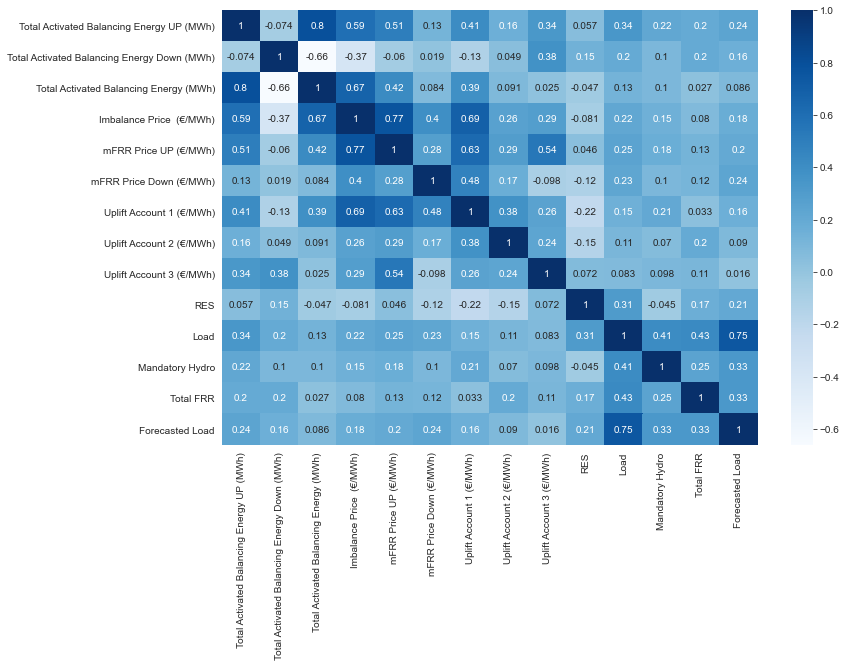

In [133]:
f, ax = plt.subplots(figsize=(12, 8))
sns.heatmap(combined_dataframes.corr(), cmap='Blues', annot=True)
plt.show()

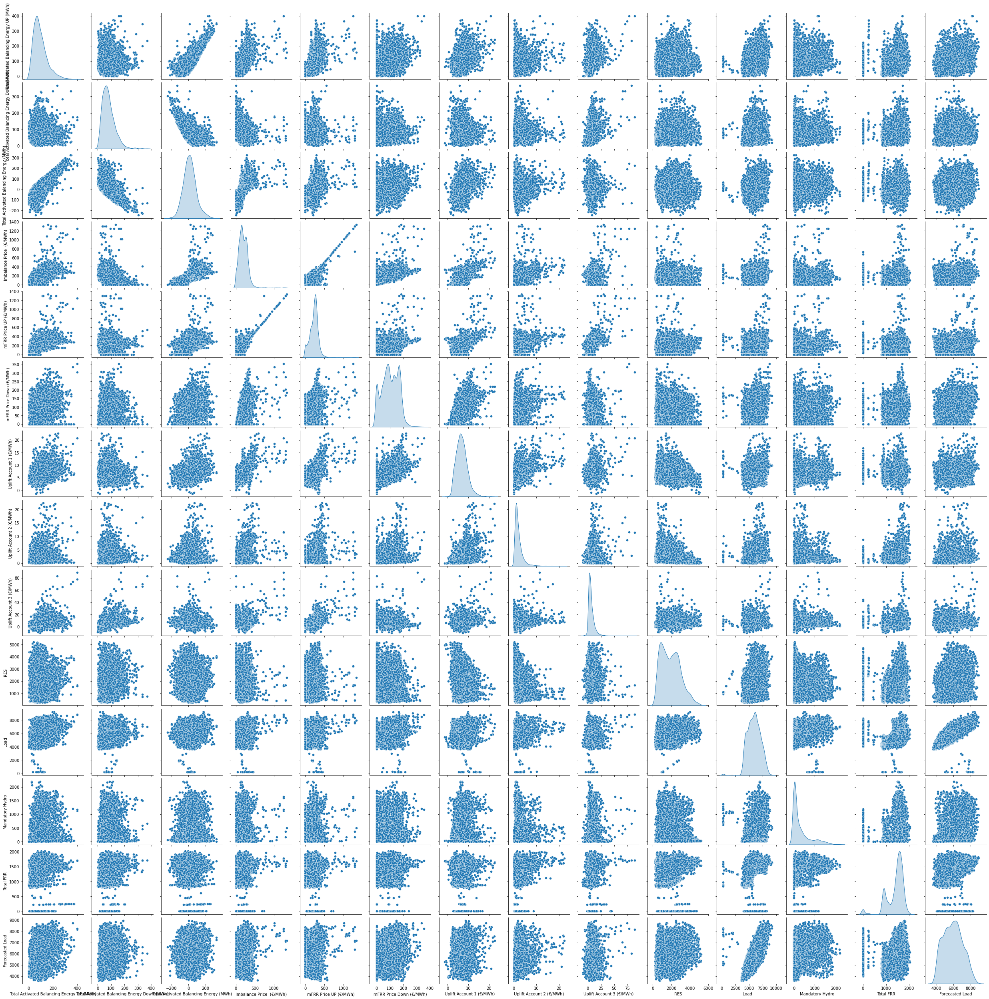

In [178]:
sns.pairplot(data=combined_dataframes, diag_kind='kde')

$\textbf{Now we are going to add the Day Ahead Prices}$

In [134]:
day_ahead_prices =client.query_day_ahead_prices(country_code, start= start, end = end)

In [135]:
len(day_ahead_prices)

5929

In [136]:
day_ahead_prices = day_ahead_prices.iloc[21:5925 ,]

In [137]:
len(day_ahead_prices)

5904

In [138]:
combined_dataframes["Day_ahead_price"] = day_ahead_prices.values

In [139]:
combined_dataframes.head()

,Total Activated Balancing Energy UP (MWh),Total Activated Balancing Energy Down (MWh),Total Activated Balancing Energy (MWh),Imbalance Price (€/MWh),mFRR Price UP (€/MWh),mFRR Price Down (€/MWh),Uplift Account 1 (€/MWh),Uplift Account 2 (€/MWh),Uplift Account 3 (€/MWh),RES,Load,Mandatory Hydro,Total FRR,Forecasted Load,Day_ahead_price
2021-08-15 00:00:00,64.696300,162.704473,-98.008173,38.036567,141.3900,40.7625,2.738548,0.662670,5.481142,1820.0,5515.5,50.0,914.0,6021.0,95.16
2021-08-15 01:00:00,47.823965,117.162650,-69.338685,23.803718,86.9275,26.3325,2.375837,1.098814,2.754350,1930.0,5299.0,50.0,939.0,5636.0,103.16
2021-08-15 02:00:00,37.976322,56.592600,-18.616278,25.178707,27.8250,0.0100,2.143069,1.201918,3.213499,2000.0,5127.5,50.0,949.0,5355.0,91.91
2021-08-15 03:00:00,36.129990,105.814593,-69.684602,0.010000,28.5925,0.0100,2.043232,1.117085,3.079745,2035.0,5038.0,63.0,939.0,5165.0,77.00
2021-08-15 04:00:00,34.597000,90.711290,-56.114290,17.827500,28.5925,17.8275,2.227400,1.156230,2.383576,2055.0,4951.5,76.0,1079.0,4994.0,83.80


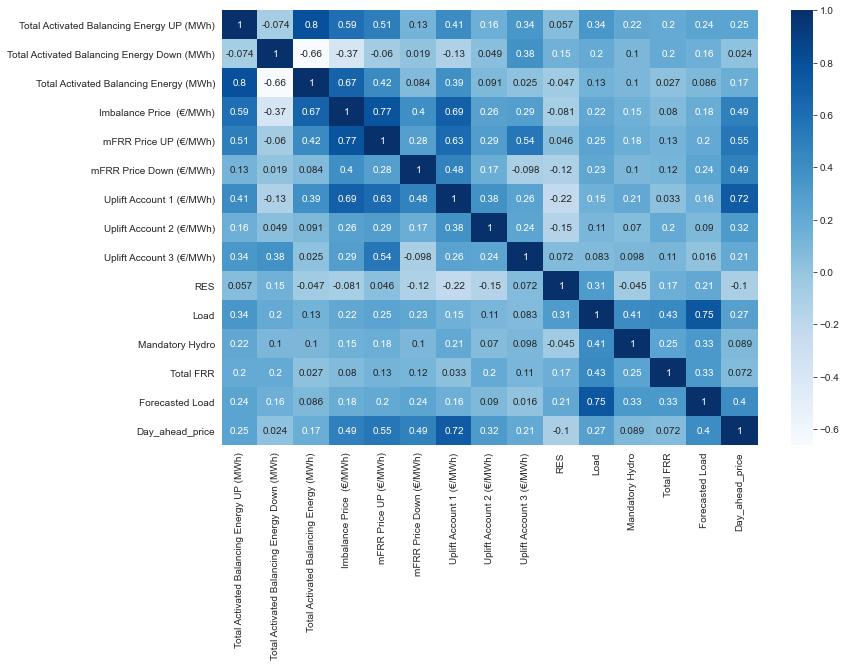

In [140]:
f, ax = plt.subplots(figsize=(12, 8))
sns.heatmap(combined_dataframes.corr(), cmap='Blues', annot=True)
plt.show()

In [143]:
def df_info_2(df):
    len_df = len(df)
    sample = []
    p_nan = []
    corrSP = []
    all_uniq = []
    feature = features[3]
    for i in df.columns:
        head_col = str(list(df[i].head(5)))
        sample.append(head_col)
        all_nan = df[i].isna().sum() #.sum()
        if all_nan == len_df:
            p_nan.append(100)
        elif all_nan == 0:
            p_nan.append(0)
        else:
            p_nan.append(round(all_nan / len_df * 100, 2))
         
        if df[i].nunique() <= 5:
            all_uniq.append(str(list(set(df[i]))))
        else:
            all_uniq.append("Several")
 
    if "Day_ahead_price" in df:
        corrSP = df.corr(method='pearson').Day_ahead_price
        
    else:
        corrSP = np.nan

    list_of_numerics = df.select_dtypes(include = ['float','int']).columns
    outl = df.apply(lambda x: sum(
                     (x<(x.quantile(0.05) - 1.5 * (x.quantile(0.95)-x.quantile(0.05)))) |
                     (x>(x.quantile(0.95) + 1.5 * (x.quantile(0.95)-x.quantile(0.05))))
                     if x.name in list_of_numerics else '') )

    df_resume = pd.DataFrame({ 
                        'type': list(df.dtypes),
                        'Sample': sample,
                        "% of NaN": p_nan,
                        "Corr_with_y": corrSP,
                        'Duplicates' : (df.duplicated()).sum(),
                        'Amount Uniques' : df.nunique(),
                        'Uniques' : all_uniq,                        
                        'Outliers' : outl } , index = df.columns)
    df_resume = df_resume.sort_values(by = "Corr_with_y")
    
    return df_resume

pd.set_option('max_rows', None)


In [144]:
df_info_2(combined_dataframes)

,type,Sample,% of NaN,Corr_with_y,Duplicates,Amount Uniques,Uniques,Outliers
RES,float64,"[1820.0, 1930.0, 2000.0, 2035.0, 2055.0]",0,-0.102659,0,857,Several,0
Total Activated Balancing Energy Down (MWh),float64,"[162.7044725, 117.16265, 56.592600000000004, 1...",0,0.023675,0,5904,Several,0
Total FRR,float64,"[914.0, 939.0, 949.0, 939.0, 1079.0]",0,0.072386,0,475,Several,0
Mandatory Hydro,float64,"[50.0, 50.0, 50.0, 63.0, 76.0]",0,0.089390,0,1573,Several,0
Total Activated Balancing Energy (MWh),float64,"[-98.00817250000001, -69.33868500000001, -18.6...",0,0.171823,0,5904,Several,0
Uplift Account 3 (€/MWh),float64,"[5.48114178, 2.7543496524999997, 3.21349915, 3...",0,0.205866,0,5904,Several,20
Total Activated Balancing Energy UP (MWh),float64,"[64.6963, 47.823965, 37.976322499999995, 36.12...",0,0.247444,0,5904,Several,0
Load,float64,"[5515.5, 5299.0, 5127.5, 5038.0, 4951.5]",0,0.270865,0,4219,Several,0
Uplift Account 2 (€/MWh),float64,"[0.662670305, 1.0988136525, 1.2019179125, 1.11...",0,0.316798,0,5904,Several,29
Forecasted Load,float64,"[6021.0, 5636.0, 5355.0, 5165.0, 4994.0]",0,0.404640,0,3205,Several,0


$\textbf{Uplift Account seems to have positive correlation with both Day ahead Prices and Imbalance Prices}$

$$UPLIFT_1 = LOSSES_t \cdot \frac{MQ_{p,t}}{\sum_p MQ_{p,t}}$$

* LOSSES : το συνολικό κόστος των Απωλειών ΕΣΜΗΕ, σε €, όπως προκύπτει από την εκκαθάριση της Αγοράς Επόμενης Ημέρας, την εκκαθάριση της Ενδοημερήσιας Αγοράς και την Εκκαθάριση Αποκλίσεων για τις Απώλειες αυτές, για την Περίοδο Εκκαθάρισης Αποκλίσεων t,
* MQ :η απορρόφηση (υπολογιζόμενη στο Όριο Συστήματος ΜεταφοράςΔικτύου Διανομής) σε MWh που αντιστοιχεί στους καταναλωτές του Διασυνδεδεμένου Συστήματος ανά Συμβαλλόμενο Μέρος με Ευθύνη Εξισορρόπησης p για την Περίοδο Εκκαθάρισης Αποκλίσεων t.

* 

$\textbf{We add now a new column with the difference between the Day Ahead price and the Balancing Price}$

$$\psi = \lambda^D - \lambda^B$$

In [145]:
combined_dataframes.head()
combined_dataframes["Day_ahead_Balancing_diff"] = combined_dataframes.iloc[:,14].values - combined_dataframes.iloc[:,3].values

In [146]:
combined_dataframes.head()

,Total Activated Balancing Energy UP (MWh),Total Activated Balancing Energy Down (MWh),Total Activated Balancing Energy (MWh),Imbalance Price (€/MWh),mFRR Price UP (€/MWh),mFRR Price Down (€/MWh),Uplift Account 1 (€/MWh),Uplift Account 2 (€/MWh),Uplift Account 3 (€/MWh),RES,Load,Mandatory Hydro,Total FRR,Forecasted Load,Day_ahead_price,Day_ahead_Balancing_diff
2021-08-15 00:00:00,64.696300,162.704473,-98.008173,38.036567,141.3900,40.7625,2.738548,0.662670,5.481142,1820.0,5515.5,50.0,914.0,6021.0,95.16,57.123433
2021-08-15 01:00:00,47.823965,117.162650,-69.338685,23.803718,86.9275,26.3325,2.375837,1.098814,2.754350,1930.0,5299.0,50.0,939.0,5636.0,103.16,79.356282
2021-08-15 02:00:00,37.976322,56.592600,-18.616278,25.178707,27.8250,0.0100,2.143069,1.201918,3.213499,2000.0,5127.5,50.0,949.0,5355.0,91.91,66.731293
2021-08-15 03:00:00,36.129990,105.814593,-69.684602,0.010000,28.5925,0.0100,2.043232,1.117085,3.079745,2035.0,5038.0,63.0,939.0,5165.0,77.00,76.990000
2021-08-15 04:00:00,34.597000,90.711290,-56.114290,17.827500,28.5925,17.8275,2.227400,1.156230,2.383576,2055.0,4951.5,76.0,1079.0,4994.0,83.80,65.972500


In [147]:
features  = combined_dataframes.columns

In [58]:
features[4]

'mFRR Price UP (€/MWh)'

$\textbf{We are going to check for some outliers in the data}$

Boxplot, IQR, qutliner for Total activated balancing energy up (mwh)


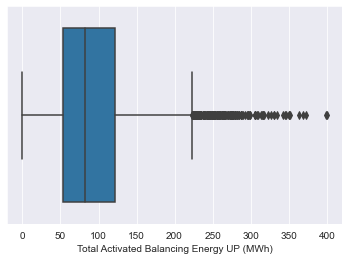

IQR For Total activated balancing energy up (mwh) Column :  68.00474374999999
There are 204 outliers out of 5904 data points.
There are many outliners in Total activated balancing energy up (mwh) columns
Boxplot, IQR, qutliner for Total activated balancing energy down (mwh)


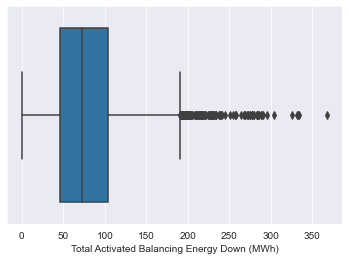

IQR For Total activated balancing energy down (mwh) Column :  57.50277062499999
There are 133 outliers out of 5904 data points.
There are many outliners in Total activated balancing energy down (mwh) columns
Boxplot, IQR, qutliner for Total activated balancing energy (mwh)


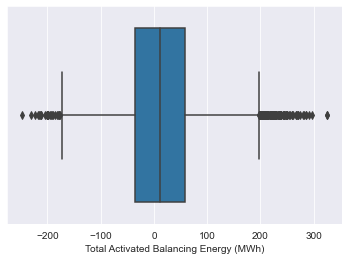

IQR For Total activated balancing energy (mwh) Column :  93.37087541666666
There are 139 outliers out of 5904 data points.
There are many outliners in Total activated balancing energy (mwh) columns
Boxplot, IQR, qutliner for Imbalance price  (€/mwh)


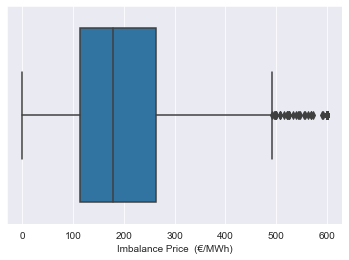

IQR For Imbalance price  (€/mwh) Column :  151.492796376875
There are 66 outliers out of 5904 data points.
There are many outliners in Imbalance price  (€/mwh) columns
Boxplot, IQR, qutliner for Mfrr price up (€/mwh)


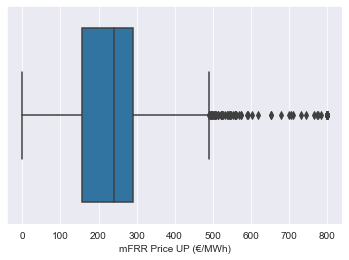

IQR For Mfrr price up (€/mwh) Column :  133.37062500000002
There are 81 outliers out of 5904 data points.
There are many outliners in Mfrr price up (€/mwh) columns
Boxplot, IQR, qutliner for Mfrr price down (€/mwh)


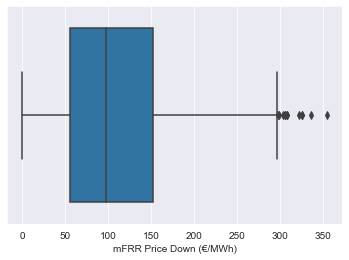

IQR For Mfrr price down (€/mwh) Column :  96.74124999999997
There are 13 outliers out of 5904 data points.
There are many outliners in Mfrr price down (€/mwh) columns
Boxplot, IQR, qutliner for Uplift account 1 (€/mwh)


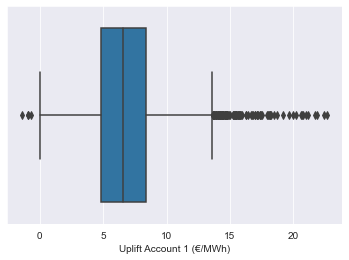

IQR For Uplift account 1 (€/mwh) Column :  3.505742676249998
There are 116 outliers out of 5904 data points.
There are many outliners in Uplift account 1 (€/mwh) columns
Boxplot, IQR, qutliner for Uplift account 2 (€/mwh)


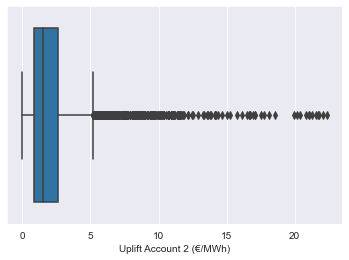

IQR For Uplift account 2 (€/mwh) Column :  1.7167358975
There are 395 outliers out of 5904 data points.
There are many outliners in Uplift account 2 (€/mwh) columns
Boxplot, IQR, qutliner for Uplift account 3 (€/mwh)


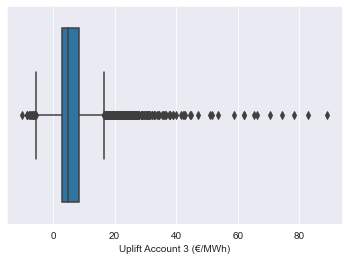

IQR For Uplift account 3 (€/mwh) Column :  5.504303299375
There are 325 outliers out of 5904 data points.
There are many outliners in Uplift account 3 (€/mwh) columns
Boxplot, IQR, qutliner for Res


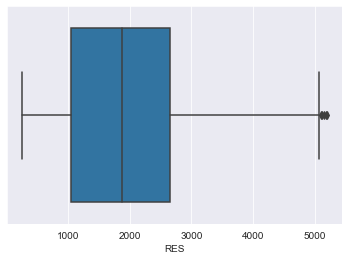

IQR For Res Column :  1610.0
There are 5 outliers out of 5904 data points.
There are many outliners in Res columns
Boxplot, IQR, qutliner for Load


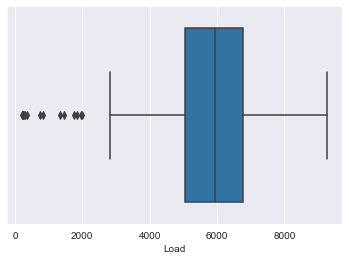

IQR For Load Column :  1709.75
There are 23 outliers out of 5904 data points.
There are many outliners in Load columns
Boxplot, IQR, qutliner for Mandatory hydro


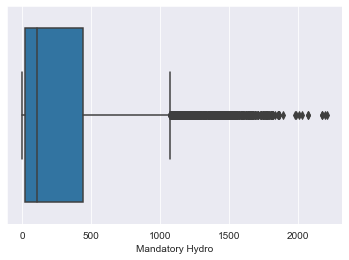

IQR For Mandatory hydro Column :  420.0
There are 598 outliers out of 5904 data points.
There are many outliners in Mandatory hydro columns
Boxplot, IQR, qutliner for Total frr


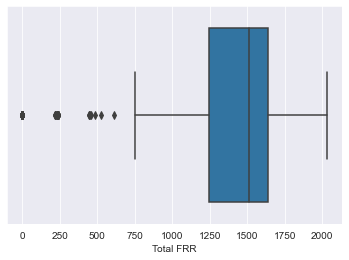

IQR For Total frr Column :  392.0
There are 168 outliers out of 5904 data points.
There are many outliners in Total frr columns
Boxplot, IQR, qutliner for Forecasted load


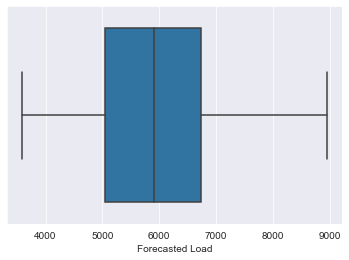

IQR For Forecasted load Column :  1692.25
There are 0 outliers out of 5904 data points.
Boxplot, IQR, qutliner for Day_ahead_price


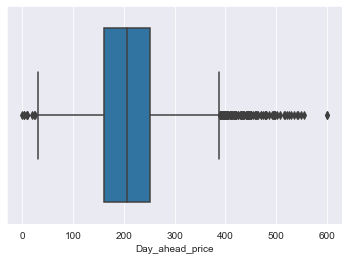

IQR For Day_ahead_price Column :  90.9325
There are 136 outliers out of 5904 data points.
There are many outliners in Day_ahead_price columns
Boxplot, IQR, qutliner for Day_ahead_balancing_diff


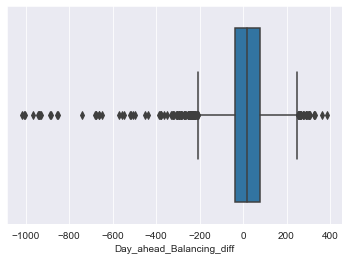

IQR For Day_ahead_balancing_diff Column :  114.85491436624999
There are 125 outliers out of 5904 data points.
There are many outliners in Day_ahead_balancing_diff columns


In [152]:
%matplotlib inline
from scipy import stats
n = combined_dataframes[features[0]].count()
new_df = combined_dataframes.copy()

for name in features: # this was "for name in names"
    print(f"Boxplot, IQR, qutliner for {name.capitalize()}")
    sns.boxplot(x=combined_dataframes[name])
    q1 = combined_dataframes[name].quantile(0.25)
    q3 = combined_dataframes[name].quantile(0.75)
    lower = q1 - 1.5 * stats.iqr(combined_dataframes[name],axis=0)
    upper = q3 + 1.5 * stats.iqr(combined_dataframes[name],axis=0)
    n_outliers = combined_dataframes[combined_dataframes[name] > upper][name].count() + combined_dataframes[combined_dataframes[name] < lower][name].count()
    plt.show()
    print(f"IQR For {name.capitalize()} Column : ",stats.iqr(combined_dataframes[name],axis=0))
    print(f"There are {n_outliers} outliers out of {n} data points.")
    if n_outliers != 0:
        p = n/n_outliers
        if p > 0.1:
            print(f"There are many outliners in {name.capitalize()} columns")
    
    new_df = new_df[new_df[name] < upper]
    new_df = new_df[new_df[name] > lower]

$\textbf{All the prices of the Balancing Market prices that are >= 600 will be replaced with 600}$

In [150]:
combined_dataframes[features[3]].loc[combined_dataframes[features[3]]>= 600 ] = 600

In [151]:
combined_dataframes[features[4]].loc[combined_dataframes[features[4]]>=800] = 800

In [156]:
combined_dataframes[features[11]].loc[combined_dataframes[features[11]]>= 1800] = 1500

Boxplot, IQR, qutliner for Total activated balancing energy up (mwh)


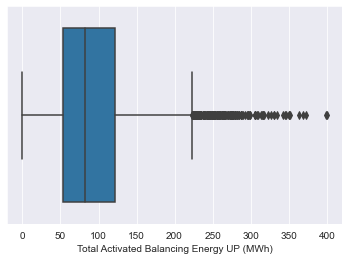

IQR For Total activated balancing energy up (mwh) Column :  68.00474374999999
There are 204 outliers out of 5904 data points.
There are many outliners in Total activated balancing energy up (mwh) columns
Boxplot, IQR, qutliner for Total activated balancing energy down (mwh)


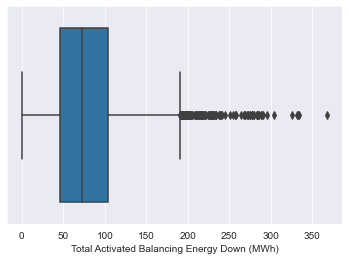

IQR For Total activated balancing energy down (mwh) Column :  57.50277062499999
There are 133 outliers out of 5904 data points.
There are many outliners in Total activated balancing energy down (mwh) columns
Boxplot, IQR, qutliner for Total activated balancing energy (mwh)


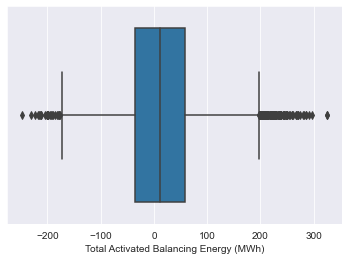

IQR For Total activated balancing energy (mwh) Column :  93.37087541666666
There are 139 outliers out of 5904 data points.
There are many outliners in Total activated balancing energy (mwh) columns
Boxplot, IQR, qutliner for Imbalance price  (€/mwh)


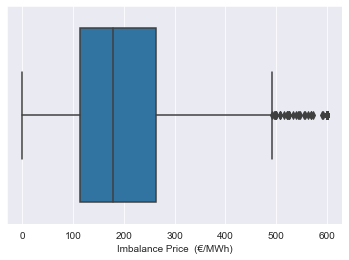

IQR For Imbalance price  (€/mwh) Column :  151.492796376875
There are 66 outliers out of 5904 data points.
There are many outliners in Imbalance price  (€/mwh) columns
Boxplot, IQR, qutliner for Mfrr price up (€/mwh)


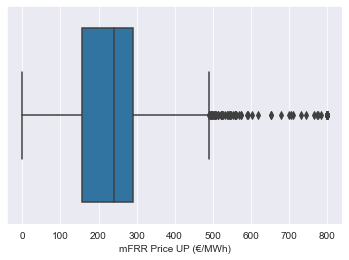

IQR For Mfrr price up (€/mwh) Column :  133.37062500000002
There are 81 outliers out of 5904 data points.
There are many outliners in Mfrr price up (€/mwh) columns
Boxplot, IQR, qutliner for Mfrr price down (€/mwh)


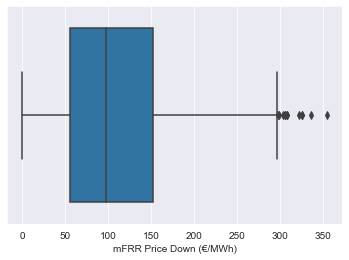

IQR For Mfrr price down (€/mwh) Column :  96.74124999999997
There are 13 outliers out of 5904 data points.
There are many outliners in Mfrr price down (€/mwh) columns
Boxplot, IQR, qutliner for Uplift account 1 (€/mwh)


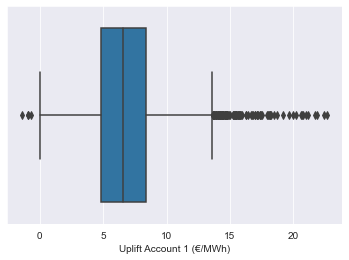

IQR For Uplift account 1 (€/mwh) Column :  3.505742676249998
There are 116 outliers out of 5904 data points.
There are many outliners in Uplift account 1 (€/mwh) columns
Boxplot, IQR, qutliner for Uplift account 2 (€/mwh)


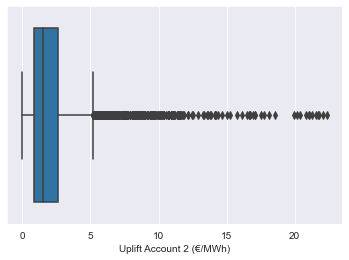

IQR For Uplift account 2 (€/mwh) Column :  1.7167358975
There are 395 outliers out of 5904 data points.
There are many outliners in Uplift account 2 (€/mwh) columns
Boxplot, IQR, qutliner for Uplift account 3 (€/mwh)


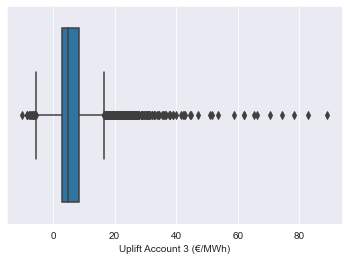

IQR For Uplift account 3 (€/mwh) Column :  5.504303299375
There are 325 outliers out of 5904 data points.
There are many outliners in Uplift account 3 (€/mwh) columns
Boxplot, IQR, qutliner for Res


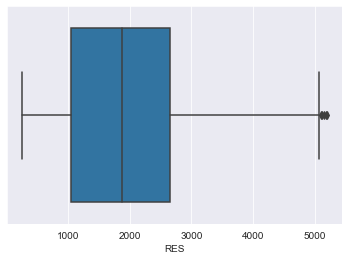

IQR For Res Column :  1610.0
There are 5 outliers out of 5904 data points.
There are many outliners in Res columns
Boxplot, IQR, qutliner for Load


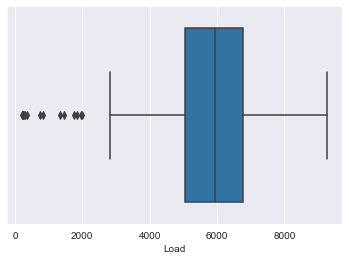

IQR For Load Column :  1709.75
There are 23 outliers out of 5904 data points.
There are many outliners in Load columns
Boxplot, IQR, qutliner for Mandatory hydro


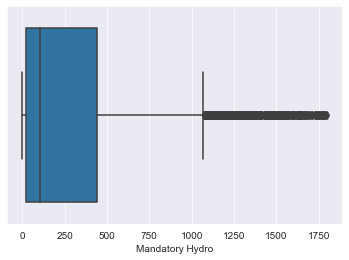

IQR For Mandatory hydro Column :  420.0
There are 598 outliers out of 5904 data points.
There are many outliners in Mandatory hydro columns
Boxplot, IQR, qutliner for Total frr


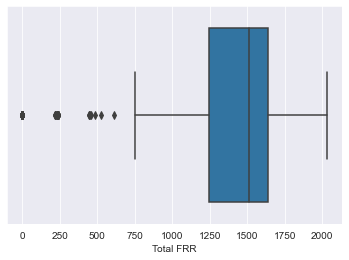

IQR For Total frr Column :  392.0
There are 168 outliers out of 5904 data points.
There are many outliners in Total frr columns
Boxplot, IQR, qutliner for Forecasted load


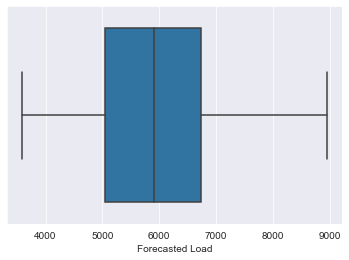

IQR For Forecasted load Column :  1692.25
There are 0 outliers out of 5904 data points.
Boxplot, IQR, qutliner for Day_ahead_price


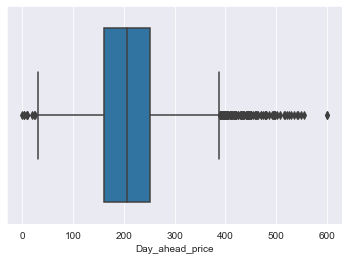

IQR For Day_ahead_price Column :  90.9325
There are 136 outliers out of 5904 data points.
There are many outliners in Day_ahead_price columns
Boxplot, IQR, qutliner for Day_ahead_balancing_diff


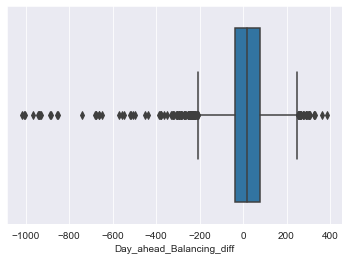

IQR For Day_ahead_balancing_diff Column :  114.85491436624999
There are 125 outliers out of 5904 data points.
There are many outliners in Day_ahead_balancing_diff columns


In [157]:
%matplotlib inline
from scipy import stats
n = combined_dataframes[features[0]].count()
new_df = combined_dataframes.copy()

for name in features: # this was "for name in names"
    print(f"Boxplot, IQR, qutliner for {name.capitalize()}")
    sns.boxplot(x=combined_dataframes[name])
    q1 = combined_dataframes[name].quantile(0.25)
    q3 = combined_dataframes[name].quantile(0.75)
    lower = q1 - 1.5 * stats.iqr(combined_dataframes[name],axis=0)
    upper = q3 + 1.5 * stats.iqr(combined_dataframes[name],axis=0)
    n_outliers = combined_dataframes[combined_dataframes[name] > upper][name].count() + combined_dataframes[combined_dataframes[name] < lower][name].count()
    plt.show()
    print(f"IQR For {name.capitalize()} Column : ",stats.iqr(combined_dataframes[name],axis=0))
    print(f"There are {n_outliers} outliers out of {n} data points.")
    if n_outliers != 0:
        p = n/n_outliers
        if p > 0.1:
            print(f"There are many outliners in {name.capitalize()} columns")
    
    new_df = new_df[new_df[name] < upper]
    new_df = new_df[new_df[name] > lower]

In [63]:
column_names = ['Activated_energy_up','Activated_energy_down','Activated_balancing_energy','Imbalance_price','mFRR_up','mFRR_down','Uplift_account_1','Uplift_account_2','Uplift_account_3','RES','Load','Mandatory_hydro','Total_FRR','Forecasted_load','Day_ahead_price','Day_ahead_Balancing_diff']

In [158]:
combined_dataframes["Diff_direction"] = [1 if int(x) >= 0 else 0 for x in combined_dataframes[features[15]]]

In [159]:
combined_dataframes.head(50)

,Total Activated Balancing Energy UP (MWh),Total Activated Balancing Energy Down (MWh),Total Activated Balancing Energy (MWh),Imbalance Price (€/MWh),mFRR Price UP (€/MWh),mFRR Price Down (€/MWh),Uplift Account 1 (€/MWh),Uplift Account 2 (€/MWh),Uplift Account 3 (€/MWh),RES,Load,Mandatory Hydro,Total FRR,Forecasted Load,Day_ahead_price,Day_ahead_Balancing_diff,Diff_direction
2021-08-15 00:00:00,64.696300,162.704473,-98.008173,38.036567,141.3900,40.7625,2.738548,0.662670,5.481142,1820.0,5515.5,50.0,914.0,6021.0,95.16,57.123433,1
2021-08-15 01:00:00,47.823965,117.162650,-69.338685,23.803718,86.9275,26.3325,2.375837,1.098814,2.754350,1930.0,5299.0,50.0,939.0,5636.0,103.16,79.356282,1
2021-08-15 02:00:00,37.976322,56.592600,-18.616278,25.178707,27.8250,0.0100,2.143069,1.201918,3.213499,2000.0,5127.5,50.0,949.0,5355.0,91.91,66.731293,1
2021-08-15 03:00:00,36.129990,105.814593,-69.684602,0.010000,28.5925,0.0100,2.043232,1.117085,3.079745,2035.0,5038.0,63.0,939.0,5165.0,77.00,76.990000,1
2021-08-15 04:00:00,34.597000,90.711290,-56.114290,17.827500,28.5925,17.8275,2.227400,1.156230,2.383576,2055.0,4951.5,76.0,1079.0,4994.0,83.80,65.972500,1
2021-08-15 05:00:00,23.384867,88.882660,-65.497793,37.320917,21.4750,37.6525,2.415373,1.498065,0.763712,2105.0,4880.5,117.5,1384.0,4954.0,85.49,48.169083,1
2021-08-15 06:00:00,56.135750,116.949175,-60.813425,32.928623,112.3875,33.0875,2.536944,1.597661,3.928055,2435.0,5053.5,185.0,1474.0,4847.0,83.80,50.871377,1
2021-08-15 07:00:00,62.005892,131.068113,-69.062220,60.054188,82.5550,61.6525,2.723008,0.980892,2.221637,3055.0,5346.5,213.0,1499.0,4897.0,91.93,31.875812,1
2021-08-15 08:00:00,32.436923,132.730417,-100.293495,45.508474,89.1600,48.1425,2.246637,1.604952,2.926384,3715.0,5646.5,200.0,1479.0,5189.0,104.92,59.411526,1
2021-08-15 09:00:00,31.486835,130.387880,-98.901045,13.401893,0.0000,14.9750,1.786450,1.295112,2.843992,4145.0,6011.5,168.0,1459.0,5411.0,91.90,78.498107,1


In [160]:
features  = combined_dataframes.columns

In [67]:
combined_dataframes["Date"] = combined_dataframes.index
combined_dataframes.to_csv('All_data.csv',index=True, encoding='utf-8')

$\textbf{We are going to choose the right model in order to predict the Day Ahead Balancing Difference}$

Regression Model 

Classification Model

$\textbf{1) We are first going to create a classification Model}$

In [185]:
y = combined_dataframes['Diff_direction']
y.value_counts()

1    3408
0    2496
Name: Diff_direction, dtype: int64

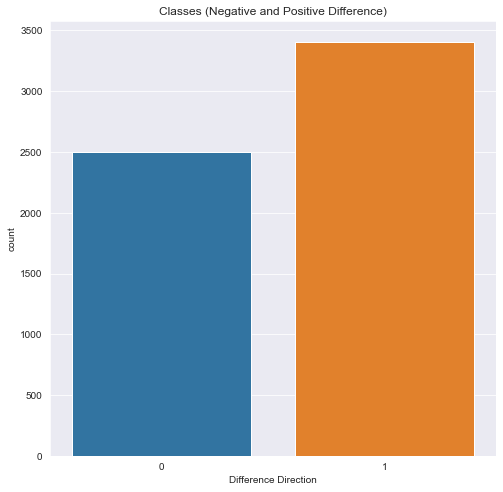

In [186]:
plt.figure(figsize=(8, 8))
sns.countplot(data=combined_dataframes, x='Diff_direction')
plt.title('Classes (Negative and Positive Difference)')
plt.xlabel("Difference Direction")
plt.show()

In [187]:
combined_dataframes.head()
#combined_dataframes = combined_dataframes.drop("Date",axis=1)

,Total Activated Balancing Energy UP (MWh),Total Activated Balancing Energy Down (MWh),Total Activated Balancing Energy (MWh),Imbalance Price (€/MWh),mFRR Price UP (€/MWh),mFRR Price Down (€/MWh),Uplift Account 1 (€/MWh),Uplift Account 2 (€/MWh),Uplift Account 3 (€/MWh),RES,Load,Mandatory Hydro,Total FRR,Forecasted Load,Day_ahead_price,Day_ahead_Balancing_diff,Diff_direction
2021-08-15 00:00:00,64.696300,162.704473,-98.008173,38.036567,141.3900,40.7625,2.738548,0.662670,5.481142,1820.0,5515.5,50.0,914.0,6021.0,95.16,57.123433,1
2021-08-15 01:00:00,47.823965,117.162650,-69.338685,23.803718,86.9275,26.3325,2.375837,1.098814,2.754350,1930.0,5299.0,50.0,939.0,5636.0,103.16,79.356282,1
2021-08-15 02:00:00,37.976322,56.592600,-18.616278,25.178707,27.8250,0.0100,2.143069,1.201918,3.213499,2000.0,5127.5,50.0,949.0,5355.0,91.91,66.731293,1
2021-08-15 03:00:00,36.129990,105.814593,-69.684602,0.010000,28.5925,0.0100,2.043232,1.117085,3.079745,2035.0,5038.0,63.0,939.0,5165.0,77.00,76.990000,1
2021-08-15 04:00:00,34.597000,90.711290,-56.114290,17.827500,28.5925,17.8275,2.227400,1.156230,2.383576,2055.0,4951.5,76.0,1079.0,4994.0,83.80,65.972500,1


In [188]:
x = combined_dataframes.drop([features[3],features[13],features[14],features[15],features[16]], axis=1)
x.head()

,Total Activated Balancing Energy UP (MWh),Total Activated Balancing Energy Down (MWh),Total Activated Balancing Energy (MWh),mFRR Price UP (€/MWh),mFRR Price Down (€/MWh),Uplift Account 1 (€/MWh),Uplift Account 2 (€/MWh),Uplift Account 3 (€/MWh),RES,Load,Mandatory Hydro,Total FRR
2021-08-15 00:00:00,64.696300,162.704473,-98.008173,141.3900,40.7625,2.738548,0.662670,5.481142,1820.0,5515.5,50.0,914.0
2021-08-15 01:00:00,47.823965,117.162650,-69.338685,86.9275,26.3325,2.375837,1.098814,2.754350,1930.0,5299.0,50.0,939.0
2021-08-15 02:00:00,37.976322,56.592600,-18.616278,27.8250,0.0100,2.143069,1.201918,3.213499,2000.0,5127.5,50.0,949.0
2021-08-15 03:00:00,36.129990,105.814593,-69.684602,28.5925,0.0100,2.043232,1.117085,3.079745,2035.0,5038.0,63.0,939.0
2021-08-15 04:00:00,34.597000,90.711290,-56.114290,28.5925,17.8275,2.227400,1.156230,2.383576,2055.0,4951.5,76.0,1079.0


In [189]:
combined_dataframes.head()

,Total Activated Balancing Energy UP (MWh),Total Activated Balancing Energy Down (MWh),Total Activated Balancing Energy (MWh),Imbalance Price (€/MWh),mFRR Price UP (€/MWh),mFRR Price Down (€/MWh),Uplift Account 1 (€/MWh),Uplift Account 2 (€/MWh),Uplift Account 3 (€/MWh),RES,Load,Mandatory Hydro,Total FRR,Forecasted Load,Day_ahead_price,Day_ahead_Balancing_diff,Diff_direction
2021-08-15 00:00:00,64.696300,162.704473,-98.008173,38.036567,141.3900,40.7625,2.738548,0.662670,5.481142,1820.0,5515.5,50.0,914.0,6021.0,95.16,57.123433,1
2021-08-15 01:00:00,47.823965,117.162650,-69.338685,23.803718,86.9275,26.3325,2.375837,1.098814,2.754350,1930.0,5299.0,50.0,939.0,5636.0,103.16,79.356282,1
2021-08-15 02:00:00,37.976322,56.592600,-18.616278,25.178707,27.8250,0.0100,2.143069,1.201918,3.213499,2000.0,5127.5,50.0,949.0,5355.0,91.91,66.731293,1
2021-08-15 03:00:00,36.129990,105.814593,-69.684602,0.010000,28.5925,0.0100,2.043232,1.117085,3.079745,2035.0,5038.0,63.0,939.0,5165.0,77.00,76.990000,1
2021-08-15 04:00:00,34.597000,90.711290,-56.114290,17.827500,28.5925,17.8275,2.227400,1.156230,2.383576,2055.0,4951.5,76.0,1079.0,4994.0,83.80,65.972500,1


In [190]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train,y_test = train_test_split(x,y, test_size=0.25)

In [191]:
X_train.head()
X_test.head()

,Total Activated Balancing Energy UP (MWh),Total Activated Balancing Energy Down (MWh),Total Activated Balancing Energy (MWh),mFRR Price UP (€/MWh),mFRR Price Down (€/MWh),Uplift Account 1 (€/MWh),Uplift Account 2 (€/MWh),Uplift Account 3 (€/MWh),RES,Load,Mandatory Hydro,Total FRR
2022-04-17 05:00:00,97.386922,98.351583,-0.964660,373.9100,45.0000,7.663843,0.060862,27.181982,2240.0,3946.0,93.5,1486.0
2021-08-20 10:00:00,91.921420,33.734048,58.187373,130.8575,18.3950,1.994299,1.272274,2.229852,3275.0,7427.5,269.0,1584.0
2022-03-30 15:00:00,126.453257,23.130250,103.323007,214.6700,91.0650,3.706217,0.302684,-5.358372,2970.0,5387.0,0.0,1511.0
2021-10-29 07:00:00,62.503242,47.918840,14.584402,136.8875,100.3025,7.481864,3.634612,5.004922,3255.0,5720.0,65.0,1459.0
2021-11-21 21:00:00,73.521220,38.122053,35.399168,243.3950,89.2200,9.819047,1.467222,2.009220,690.0,5499.0,61.0,1344.0


In [192]:
num_columns = X_train.columns

$\textbf{a) Logistic Regression Classification}$

In [196]:
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report,roc_auc_score

def print_score(clf, X_train, y_train, X_test, y_test, train=True):
    if train:
        pred = clf.predict(X_train)
        clf_report = pd.DataFrame(classification_report(y_train, pred, output_dict=True))
        print("Train Result:\n================================================")
        print(f"Accuracy Score: {accuracy_score(y_train, pred) * 100:.2f}%")
        print("_______________________________________________")
        print(f"CLASSIFICATION REPORT:\n{clf_report}")
        print("_______________________________________________")
        print(f"Confusion Matrix: \n {confusion_matrix(y_train, pred)}\n")
        print("_______________________________________________")
        print(f"ROV CURVE SCORE \n {roc_auc_score(y_train,pred)}\n")
        
    elif train==False:
        pred = clf.predict(X_test)
        clf_report = pd.DataFrame(classification_report(y_test, pred, output_dict=True))
        print("Test Result:\n================================================")      
        print(f"Accuracy Score: {accuracy_score(y_test, pred) * 100:.2f}%")
        print("_______________________________________________")
        print(f"CLASSIFICATION REPORT:\n{clf_report}")
        print("_______________________________________________")
        print(f"Confusion Matrix: \n {confusion_matrix(y_test, pred)}\n")
        print("_______________________________________________")
        print(f"ROC CURVE SCORE :\n {roc_auc_score(y_test,pred)}\n")

In [197]:
from sklearn.preprocessing import StandardScaler, MinMaxScaler, OrdinalEncoder
from sklearn.compose import make_column_transformer
from sklearn.model_selection import train_test_split

# cat_columns = []


ct = make_column_transformer(
    (MinMaxScaler(), num_columns),
    (StandardScaler(), num_columns),
    remainder='passthrough'
)

X_train = ct.fit_transform(X_train)
X_test = ct.transform(X_test)

ValueError: Specifying the columns using strings is only supported for pandas DataFrames

In [198]:
from sklearn.linear_model import LogisticRegression

lr_clf = LogisticRegression(solver='liblinear')
lr_clf.fit(X_train, y_train)

print_score(lr_clf, X_train, y_train, X_test, y_test, train=True)
print_score(lr_clf, X_train, y_train, X_test, y_test, train=False)

Train Result:
Accuracy Score: 83.45%
_______________________________________________
CLASSIFICATION REPORT:
                     0            1  accuracy    macro avg  weighted avg
precision     0.808273     0.852217  0.834463     0.830245      0.833996
recall        0.787582     0.867670  0.834463     0.827626      0.834463
f1-score      0.797793     0.859874  0.834463     0.828833      0.834133
support    1836.000000  2592.000000  0.834463  4428.000000   4428.000000
_______________________________________________
Confusion Matrix: 
 [[1446  390]
 [ 343 2249]]

_______________________________________________
ROV CURVE SCORE 
 0.8276257262164125

Test Result:
Accuracy Score: 83.81%
_______________________________________________
CLASSIFICATION REPORT:
                    0           1  accuracy    macro avg  weighted avg
precision    0.827372    0.846339  0.838076     0.836855      0.837857
recall       0.806061    0.863971  0.838076     0.835016      0.838076
f1-score     0.816577    

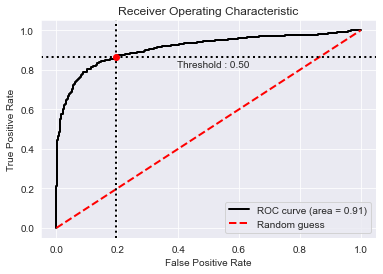

In [199]:
from plot_metric.functions import BinaryClassification
logistic_prob = lr_clf.predict_proba(X=X_test)[:,1]
bc = BinaryClassification(y_test, logistic_prob, labels=["Class 1", "Class 1"])

bc.plot_roc_curve()
plt.show()

$\textbf{b) Linear Discriminant Analysis}$

In [200]:
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA
linear_discriminator = LDA(solver='lsqr', shrinkage='auto')
lda_fit_train = linear_discriminator.fit(X_train, y_train)

In [201]:
lda_train_score = linear_discriminator.score(X_train,y_train)
lda_test_score  = linear_discriminator.score(X_test,y_test)

In [202]:
print("LDA Score Train Dataset: ", lda_train_score)
print("LDA Score Test Dataset:" , lda_test_score)

LDA Score Train Dataset:  0.8274616079494128
LDA Score Test Dataset: 0.8346883468834688


In [203]:
from sklearn.linear_model import LogisticRegression

print_score(linear_discriminator, X_train, y_train, X_test, y_test, train=True)
print_score(linear_discriminator, X_train, y_train, X_test, y_test, train=False)

Train Result:
Accuracy Score: 82.75%
_______________________________________________
CLASSIFICATION REPORT:
                     0            1  accuracy    macro avg  weighted avg
precision     0.816411     0.834309  0.827462     0.825360      0.826888
recall        0.753268     0.880015  0.827462     0.816642      0.827462
f1-score      0.783569     0.856553  0.827462     0.820061      0.826291
support    1836.000000  2592.000000  0.827462  4428.000000   4428.000000
_______________________________________________
Confusion Matrix: 
 [[1383  453]
 [ 311 2281]]

_______________________________________________
ROV CURVE SCORE 
 0.8166417029774873

Test Result:
Accuracy Score: 83.47%
_______________________________________________
CLASSIFICATION REPORT:
                    0           1  accuracy    macro avg  weighted avg
precision    0.840984    0.830254  0.834688     0.835619      0.835052
recall       0.777273    0.881127  0.834688     0.829200      0.834688
f1-score     0.807874    

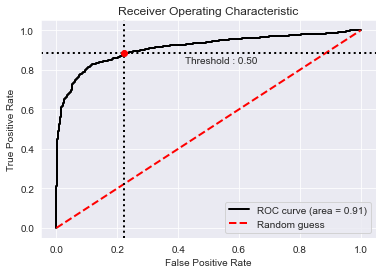

In [204]:
from plot_metric.functions import BinaryClassification
linear_discriminant_prob = linear_discriminator.predict_proba(X=X_test)[:,1]
bc_linear_discriminator = BinaryClassification(y_test, linear_discriminant_prob, labels=["Class 1", "Class 1"])

bc_linear_discriminator.plot_roc_curve()
plt.show()

$\textbf{Neural Network Classification}$

In [212]:
from sklearn.neural_network import MLPClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_curve, auc

clf1 = MLPClassifier(
    hidden_layer_sizes=(3),
    activation="relu",
    verbose=True,
    max_iter=1000
)
clf2 = MLPClassifier(
    hidden_layer_sizes=(10),
    activation="logistic",
    verbose=False,
    max_iter=10000
)

clf3 = MLPClassifier(
    hidden_layer_sizes=(50,25),
    activation="tanh",
    verbose=False,
    max_iter=10000
)

In [213]:
# Fitting MinMax Scaler to features
clf1.fit(X_train, y_train.values.ravel())
clf2.fit(X_train, y_train.values.ravel())
clf3.fit(X_train, y_train.values.ravel())

# ROC Curve
fpr1, tpr1, threshold1 = roc_curve(y_test.values, clf1.predict_proba(X_test)[:,1])
fpr2, tpr2, threshold2 = roc_curve(y_test.values, clf2.predict_proba(X_test)[:,1])
fpr3, tpr3, threshold3 = roc_curve(y_test.values, clf3.predict_proba(X_test)[:,1])

Iteration 1, loss = 0.98452382
Iteration 2, loss = 0.89482399
Iteration 3, loss = 0.82859861
Iteration 4, loss = 0.78144079
Iteration 5, loss = 0.74733713
Iteration 6, loss = 0.72306151
Iteration 7, loss = 0.70472174
Iteration 8, loss = 0.69054544
Iteration 9, loss = 0.67831858
Iteration 10, loss = 0.66803959
Iteration 11, loss = 0.65892168
Iteration 12, loss = 0.65069038
Iteration 13, loss = 0.64306686
Iteration 14, loss = 0.63563721
Iteration 15, loss = 0.62847079
Iteration 16, loss = 0.62174395
Iteration 17, loss = 0.61514961
Iteration 18, loss = 0.60886887
Iteration 19, loss = 0.60279473
Iteration 20, loss = 0.59678374
Iteration 21, loss = 0.59103818
Iteration 22, loss = 0.58536690
Iteration 23, loss = 0.57992521
Iteration 24, loss = 0.57453231
Iteration 25, loss = 0.56923285
Iteration 26, loss = 0.56430244
Iteration 27, loss = 0.55933033
Iteration 28, loss = 0.55444814
Iteration 29, loss = 0.54972344
Iteration 30, loss = 0.54498209
Iteration 31, loss = 0.54051609
Iteration 32, los

0.8480126467931346
0.8502710027100271
0.8500451671183379
0.8570460704607046
0.9979674796747967
0.8252032520325203


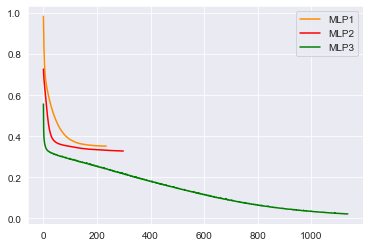

In [214]:
print(clf1.score(X_train, y_train.values.ravel()))
print(clf1.score(X_test, y_test.values.ravel()))
print(clf2.score(X_train, y_train.values.ravel()))
print(clf2.score(X_test, y_test.values.ravel()))
print(clf3.score(X_train, y_train.values.ravel()))
print(clf3.score(X_test, y_test.values.ravel()))


roc_auc1 = auc(fpr1, tpr1)
roc_auc2 = auc(fpr2, tpr2)
roc_auc3 = auc(fpr3, tpr3)

plt.plot(clf1.loss_curve_,color="darkorange",label="MLP1")
plt.plot(clf2.loss_curve_,color="red",label="MLP2")
plt.plot(clf3.loss_curve_,color="green",label="MLP3")

#pyplot.plot(clf4.loss_curve_,color="purple" , label = "MLP4")
plt.legend(loc="upper right")
plt.show()

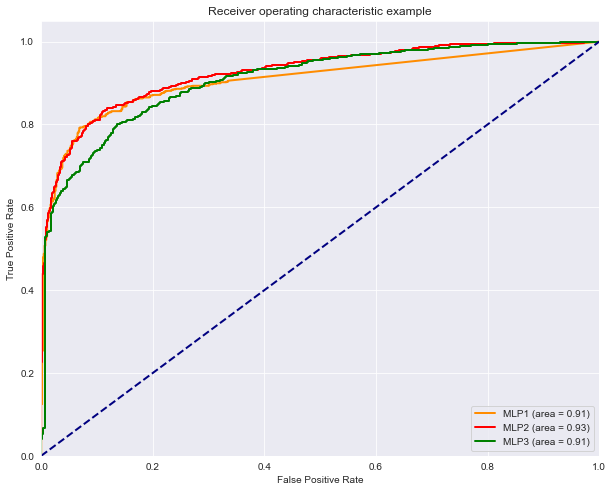

In [215]:
plt.figure(figsize=(10, 8))
lw = 2
plt.plot(
    fpr1,
    tpr1,
    color="darkorange",
    lw=lw,
    label="MLP1 (area = %0.2f)" % roc_auc1,
)
plt.plot(
    fpr2,
    tpr2,
    color="red",
    lw=lw,
    label="MLP2 (area = %0.2f)" % roc_auc2,
)
plt.plot(
    fpr3,
    tpr3,
    color="green",
    lw=lw,
    label="MLP3 (area = %0.2f)" % roc_auc3,
)

# We want bigger AUC to justify which clasifier outpermorms

plt.plot([0, 1], [0, 1], color="navy", lw=lw, linestyle="--")
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Receiver operating characteristic example")
plt.legend(loc="lower right")
plt.show()

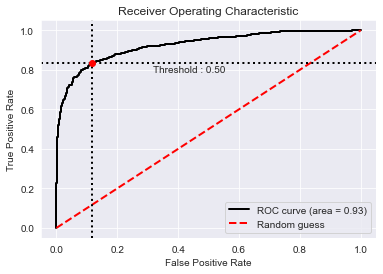

In [216]:
from plot_metric.functions import BinaryClassification
MLP2_classification_prob = clf2.predict_proba(X=X_test)[:,1]
bc_MLP2 = BinaryClassification(y_test, MLP2_classification_prob, labels=["Class 1", "Class 1"])

bc_MLP2.plot_roc_curve()
plt.show()

$\textbf{Keras Neural Networks}$

$\textbf{Boosted Decision Trees Classification}$

In [221]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier,AdaBoostClassifier,BaggingClassifier,ExtraTreesClassifier,GradientBoostingClassifier
from sklearn.model_selection import GridSearchCV, cross_val_score, StratifiedKFold, learning_curve ,KFold

In [222]:
GradientBoosting = GradientBoostingClassifier( min_samples_leaf = 70, min_samples_split = 1000,learning_rate= 0.01 , n_estimators =60 , max_depth = 3)
gradient_fit = GradientBoosting.fit(X_train, y_train)

C:\Users\USER\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


   CrossVal_Score_Means  CrossValerrors                    Algo
0              0.839425        0.011238  RandomForestClassifier
1              0.850494        0.010286      AdaBoostClassifier
2              0.851627        0.010880       Gradient Boosting
3              0.792910        0.007634  DecisionTreeClassifier


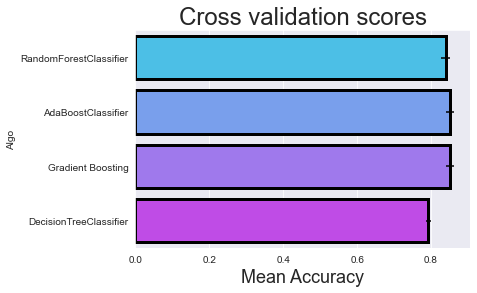

<Figure size 1080x504 with 0 Axes>

In [224]:
kfold = StratifiedKFold(n_splits=8,shuffle=True, random_state=42)

rs = 15
clrs = []

clrs.append(AdaBoostClassifier(random_state=rs))
clrs.append(GradientBoostingClassifier(random_state=rs))
clrs.append(RandomForestClassifier(random_state=rs))
clrs.append(DecisionTreeClassifier(random_state = rs))

cv_results = []
for clr in clrs :
    cv_results.append(cross_val_score(clr, X_train, y_train , scoring = 'accuracy', cv = kfold, n_jobs=-1))

cv_means = []
cv_std = []
for cv_result in cv_results:
    cv_means.append(cv_result.mean())
    cv_std.append(cv_result.std())
    
cv_df = pd.DataFrame({"CrossVal_Score_Means":cv_means,"CrossValerrors": cv_std,"Algo":["RandomForestClassifier","AdaBoostClassifier","Gradient Boosting",'DecisionTreeClassifier']})
g = sns.barplot("CrossVal_Score_Means","Algo",data = cv_df,orient = "h",**{'xerr':cv_std},palette='cool',edgecolor="black",linewidth=3)
g.set_xlabel("Mean Accuracy",fontsize = 18)
g = g.set_title("Cross validation scores",fontsize = 24)
plt.figure(figsize = (15,7))
print(cv_df)

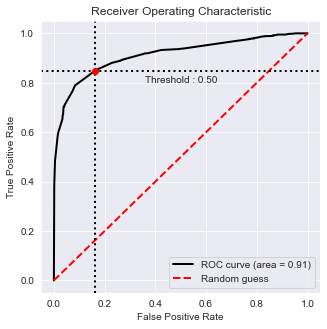

In [225]:
gradient_boost_roc = gradient_fit.predict_proba(X=X_test)
bc = BinaryClassification(y_test, gradient_boost_roc[:,1], labels=["Class 1", "Class 2"])

# Figures
plt.figure(figsize=(5,5))
bc.plot_roc_curve()
plt.show()